# Computer Science Project Implementation and Dissertation Online Version
Yong Kien Lin


# 1 - Imports and Song Test

In [230]:
#Ignore warnings

import warnings
warnings.filterwarnings("ignore")


In [104]:
#pip install librosa


In [122]:
#from google.colab import drive
#drive.mount('/content/drive')

import numpy as np
from numpy import genfromtxt

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm

#To print out all of the data.
import sys

np.set_printoptions(threshold=sys.maxsize)

#To play audio files.
from IPython.display import Audio, display

#File path functonality.
import os

import librosa

import sklearn.svm
from sklearn.svm import SVC

from sklearn.preprocessing import StandardScaler

import sklearn.model_selection
from sklearn.model_selection import train_test_split

import sklearn.metrics
from sklearn.metrics import mean_squared_error


In [106]:
#Sort song files in ascending order and play a particular song.

song_path = "C:/Users/Chi/Desktop/School Work/Year 3/Project/Implementation/Datasets/DEAM/DEAM_audio/MEMD_audio/"

songs = []

#From stackoverflow user Tom, https://stackoverflow.com/questions/50629968/how-to-sort-files-by-number-in-filename-of-a-directory
for file in sorted(os.listdir(songPath), key=lambda x: int(x.replace(".mp3", ""))):
    songs.append(song_path + file)

display(Audio(songs[1743]))
#1743 Is the cutoff for 45 second clips corresponds to mp3 2000.

# 2 - Dataset Curation

In [113]:
dynamic_valence_path = "C:/Users/Chi/Desktop/School Work/Year 3/Project/Implementation/Datasets/DEAM/DEAM_Annotations/annotations/annotations averaged per song/dynamic (per second annotations)/valence.csv"
dynamic_arousal_path = "C:/Users/Chi/Desktop/School Work/Year 3/Project/Implementation/Datasets/DEAM/DEAM_Annotations/annotations/annotations averaged per song/dynamic (per second annotations)/arousal.csv"

#Skip first column and row.
all_valence = genfromtxt(dynamic_valence_path, delimiter=',',skip_header = 1, max_rows = 1744, usecols=range(1,61))
all_arousal = genfromtxt(dynamic_arousal_path, delimiter=',',skip_header = 1, max_rows = 1744, usecols=range(1,61))

#Time axis in ms, 500ms intervals.
xAxis = [15000,15500,16000,16500,17000,17500,18000,18500,19000,19500,20000,20500,21000,21500,22000,
         22500,23000,23500,24000,24500,25000,25500,26000,26500,27000,27500,28000,28500,29000,29500,
         30000,30500,31000,31500,32000,32500,33000,33500,34000,34500,35000,35500,36000,36500,37000,
         37500,38000,38500,39000,39500,40000,40500,41000,41500,42000,42500,43000,43500,44000,44500,] 


In [114]:
song_two_rater_valence = genfromtxt("C:/Users/Chi/Desktop/School Work/Year 3/Project/Implementation/Datasets/DEAM/DEAM_Annotations/annotations/annotations per each rater/dynamic (per second annotations)/valence/1008.csv",delimiter=',',skip_header = 1, max_rows = 11, usecols=range(1,61));
song_two_rater_arousal = genfromtxt("C:/Users/Chi/Desktop/School Work/Year 3/Project/Implementation/Datasets/DEAM/DEAM_Annotations/annotations/annotations per each rater/dynamic (per second annotations)/arousal/1008.csv",delimiter=',',skip_header = 1, max_rows = 11, usecols=range(1,61));


Average Dynamic Valence and Arousal for Song 2

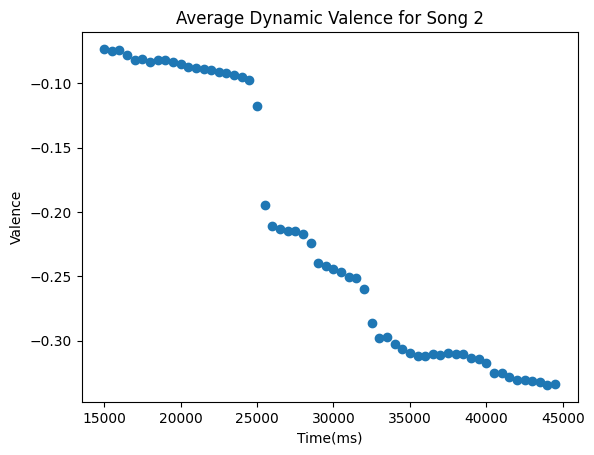

In [117]:
#For reference, the scale is -10 to 10.

#Valence for song 2.

plt.figure()
plt.title('Average Dynamic Valence for Song 2')
plt.xlabel('Time(ms)')
plt.ylabel('Valence')
plt.scatter(xAxis, all_valence[0,:])
plt.plot();


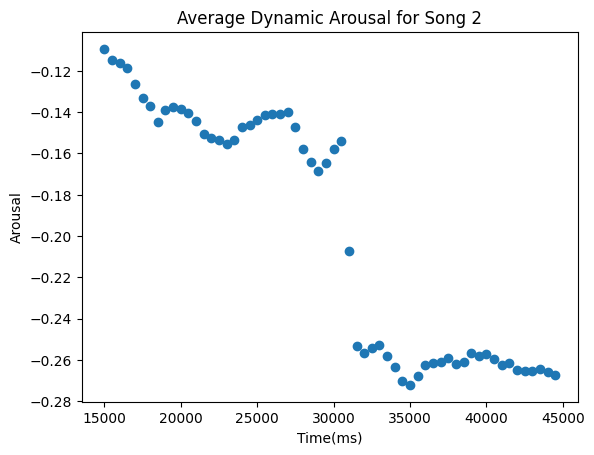

In [118]:
#Arousal for song 2

plt.figure()
plt.title('Average Dynamic Arousal for Song 2')
plt.xlabel('Time(ms)')
plt.ylabel('Arousal')
plt.scatter(xAxis, all_arousal[0,:])
plt.plot();


Dynamic Valence and Arousal for Song 2 per rater (There are 10 raters)

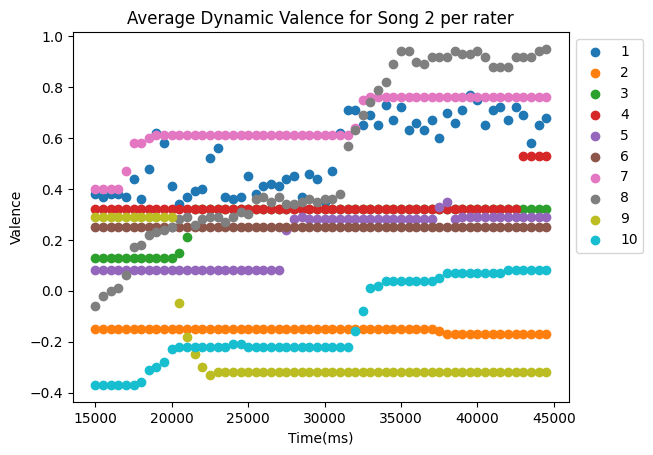

In [119]:
#Valence for song 2

plt.figure()
plt.title('Average Dynamic Valence for Song 2 per rater')
plt.xlabel('Time(ms)')
plt.ylabel('Valence')
rater_one = plt.scatter(xAxis, song_two_rater_valence[0,:], label = 1)
rater_two = plt.scatter(xAxis, song_two_rater_valence[1,:], label = 2)
rater_three = plt.scatter(xAxis, song_two_rater_valence[2,:], label = 3)
rater_four = plt.scatter(xAxis, song_two_rater_valence[3,:], label = 4)
rater_five = plt.scatter(xAxis, song_two_rater_valence[4,:], label = 5)
rater_six = plt.scatter(xAxis, song_two_rater_valence[5,:], label = 6)
rater_seven = plt.scatter(xAxis, song_two_rater_valence[6,:], label = 7)
rater_eight = plt.scatter(xAxis, song_two_rater_valence[7,:], label = 8)
rater_nine = plt.scatter(xAxis, song_two_rater_valence[8,:], label = 9)
rater_ten = plt.scatter(xAxis, song_two_rater_valence[9,:], label = 10)

plt.legend(handles=[rater_one, rater_two, rater_three, rater_four, rater_five, rater_six, rater_seven, rater_eight, rater_nine, rater_ten], loc='upper left', bbox_to_anchor=(1, 1))
plt.plot();


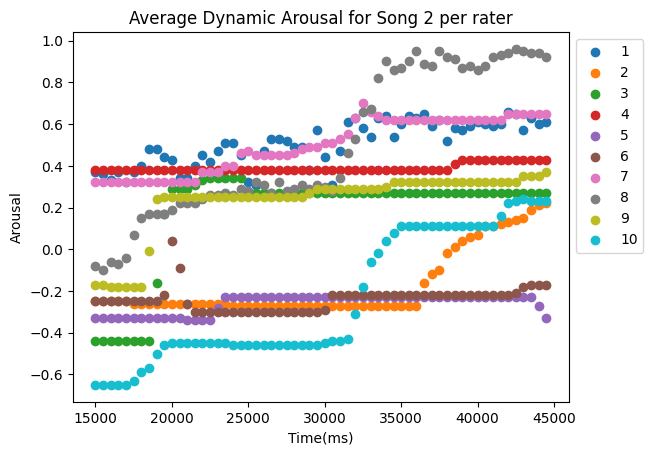

In [121]:
#Arousal for song 2

plt.figure()
plt.title('Average Dynamic Arousal for Song 2 per rater')
plt.xlabel('Time(ms)')
plt.ylabel('Arousal')
rater_one = plt.scatter(xAxis,song_two_rater_arousal[0,:], label = 1)
rater_two = plt.scatter(xAxis,song_two_rater_arousal[1,:], label = 2)
rater_three = plt.scatter(xAxis,song_two_rater_arousal[2,:], label = 3)
rater_four = plt.scatter(xAxis,song_two_rater_arousal[3,:], label = 4)
rater_five = plt.scatter(xAxis,song_two_rater_arousal[4,:], label = 5)
rater_six = plt.scatter(xAxis,song_two_rater_arousal[5,:], label = 6)
rater_seven = plt.scatter(xAxis,song_two_rater_arousal[6,:], label = 7)
rater_eight = plt.scatter(xAxis,song_two_rater_arousal[7,:], label = 8)
rater_nine = plt.scatter(xAxis,song_two_rater_arousal[8,:], label = 9)
rater_ten = plt.scatter(xAxis,song_two_rater_arousal[9,:], label = 10)

plt.legend(handles=[rater_one, rater_two, rater_three, rater_four, rater_five, rater_six, rater_seven, rater_eight, rater_nine, rater_ten], loc='upper left', bbox_to_anchor=(1, 1))
plt.plot();


# 3 - Feature Extraction

## 3.1 - Feature Set 1

In [126]:
def feature_set_1(y, sr):

    #RHYTHM

    #TEMPO ESTIMATION

    tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
    beat_times = librosa.frames_to_time(beat_frames, sr=sr)

    #ONSET RATE in time
    song_onset = librosa.onset.onset_detect(y=y, sr=sr, units='time')
    song_onset = np.mean(song_onset)

    #HARMONY

    #Chromagram

    chromagram = librosa.feature.chroma_stft(y=y, sr=sr)
    chromagram_1 = np.mean(chromagram[1])
    chromagram_2 = np.mean(chromagram[2])
    chromagram_3 = np.mean(chromagram[3])
    chromagram_4 = np.mean(chromagram[4])
    chromagram_5 = np.mean(chromagram[5])
    chromagram_6 = np.mean(chromagram[6])
    chromagram_7 = np.mean(chromagram[7])
    chromagram_8 = np.mean(chromagram[8])
    chromagram_9 = np.mean(chromagram[9])
    chromagram_10 = np.mean(chromagram[10])
    chromagram_11 = np.mean(chromagram[11])

    #MELODY

    #Compile

    songFeatures = []

    songFeatures.append(tempo)
    songFeatures.append(song_onset)
    songFeatures.append(chromagram_1)
    songFeatures.append(chromagram_2)
    songFeatures.append(chromagram_3)
    songFeatures.append(chromagram_4)
    songFeatures.append(chromagram_5)
    songFeatures.append(chromagram_6)
    songFeatures.append(chromagram_7)
    songFeatures.append(chromagram_8)
    songFeatures.append(chromagram_9)
    songFeatures.append(chromagram_10)
    songFeatures.append(chromagram_11)

    return songFeatures


Compile features

In [127]:
all_songs_feature_set_1 = []

for i in range(1744):
    chosen_song = songs[i]
    y, sr = librosa.load(chosen_song)
    particular_song = feature_set_1(y, sr)
    all_songs_feature_set_1.append(particular_song)


In [128]:
all_songs_feature_set_1 = np.array(all_songs_feature_set_1, dtype = object)


## 3.2 - Feature Set 2

In [219]:
def feature_set_2(y, sr):
    
    #TEMPO ESTIMATION
    tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
    beat_times = librosa.frames_to_time(beat_frames, sr=sr)
    
    #ONSET RATE in time
    songOnset = librosa.onset.onset_detect(y=y, sr=sr, units='time')
    songOnset = np.mean(songOnset)
    #print(songOnset)
    
    #Spectral Features
    spec_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
    
    spectral_bandwidth= np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    spectral_contrast= np.mean(librosa.feature.spectral_contrast(y=y, sr=sr))
    spectral_flatness= np.mean(librosa.feature.spectral_flatness(y=y))
    spectral_rolloff= np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))
    
    #MFCC - Mel Frequency Cepstral 
    
    mfcc= np.mean(librosa.feature.mfcc(y=y, sr=sr))
    
    #Zero_Crossing Rate
    
    zero_crossings = sum(librosa.zero_crossings(y=y, pad=False))
    
    #Harmonics and percussive components
    y_harm, y_perc = librosa.effects.hpss(y=y)
    
    songFeatures = []

    songFeatures.append(tempo)
    songFeatures.append(songOnset)
    
    songFeatures.append(spec_centroid)
    songFeatures.append(spectral_bandwidth)
    songFeatures.append(spectral_contrast)
    songFeatures.append(spectral_flatness)
    songFeatures.append(spectral_rolloff)
    songFeatures.append(mfcc)
    songFeatures.append(zero_crossings)
    songFeatures.append(np.mean(y_harm))
    songFeatures.append(np.mean(y_perc))

    return songFeatures
    

In [220]:
all_songs_feature_set_2 = []

for i in range(1744):
    chosen_song = songs[i]
    y, sr = librosa.load(chosen_song)
    particular_song = feature_set_2(y, sr)
    all_songs_feature_set_2.append(particular_song)
    

In [200]:
all_songs_feature_set_2 = np.array(all_songs_feature_set_2, dtype = object)


# 4 - ML Model 1 Support Vector Regression

In [421]:
#Compile Labels

#Valence

valence_for_songs = []

for i in range(len(all_valence)):
    valence_value = np.mean(all_valence[i,:])
    valence_for_songs.append(valence_value)

valence_for_songs = np.array(valence_for_songs, dtype=float)

#Arousal

arousal_for_songs = []

for i in range(len(all_arousal)):
    arousal_value = np.mean(all_arousal[i,:])
    arousal_for_songs.append(arousal_value)

arousal_for_songs = np.array(arousal_for_songs)

reshaped_valence_for_songs = valence_for_songs.reshape(-1,1)
reshaped_arousal_for_songs = arousal_for_songs.reshape(-1,1)


In [422]:
tts = train_test_split

fs1_song_scaler = StandardScaler()
fs2_song_scaler = StandardScaler()


## Feature Set 1

In [423]:
#Reshape data
print(len(all_songs_feature_set_1))

reshaped_all_songs_feature_set_1 = np.delete(all_songs_feature_set_1, slice(1744, 1802), 0)


1744


FS1 - Valence Model

In [424]:
#Split data

song_valence_train_data_fs1, song_valence_test_data_fs1, valence_train_label_fs1, valence_test_label_fs1 = tts(reshaped_all_songs_feature_set_1, reshaped_valence_for_songs, test_size=0.2)

#standardise data
fs1_song_scaler.fit(song_valence_train_data_fs1)

song_valence_train_data_fs1 = fs1_song_scaler.transform(song_valence_train_data_fs1)
song_valence_test_data_fs1 = fs1_song_scaler.transform(song_valence_test_data_fs1)


In [425]:
# Support Vector Regression
valence_model_fs1 = sklearn.svm.SVR()

#Valence model
valence_model_fs1.fit(song_valence_train_data_fs1, valence_train_label_fs1)

#predict labels
predicted_valence_label_fs1 = valence_model_fs1.predict(song_valence_test_data_fs1)
valence_score_fs1 = valence_model_fs1.score(song_valence_test_data_fs1, valence_test_label_fs1)

valence_mse_fs1 = mean_squared_error(valence_test_label_fs1, predicted_valence_label_fs1)

print(valence_score_fs1)
print(valence_mse_fs1)


0.06937447657686446
0.04545928999974712


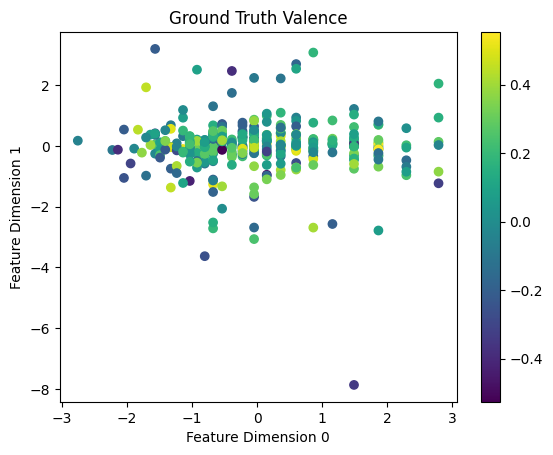

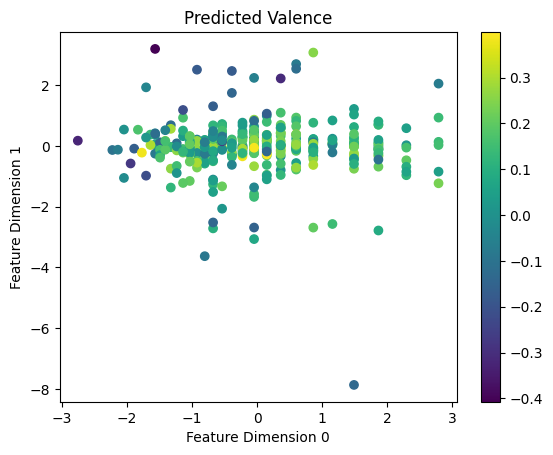

In [426]:
#Visualise ground truth vs predicted labels

#Ground Truth

plt.figure()
plt.scatter(song_valence_test_data_fs1[:,0], song_valence_test_data_fs1[:,1],c = valence_test_label_fs1)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(valence_test_label_fs1)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Ground Truth Valence")
plt.show()

#Predicted

plt.figure()
plt.scatter(song_valence_test_data_fs1[:,0], song_valence_test_data_fs1[:,1],c = predicted_valence_label_fs1)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(predicted_valence_label_fs1)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Predicted Valence")
plt.show()


FS1 -Arousal Model

In [427]:
song_arousal_train_data_fs1, song_arousal_test_data_fs1, arousal_train_label_fs1, arousal_test_label_fs1 = tts(reshaped_all_songs_feature_set_1, reshaped_arousal_for_songs, test_size=0.2)

#standardise data
fs1_song_scaler.fit(song_arousal_train_data_fs1)

song_arousal_train_data_fs1 = fs1_song_scaler.transform(song_arousal_train_data_fs1)
song_arousal_test_data_fs1 = fs1_song_scaler.transform(song_arousal_test_data_fs1)


In [428]:
# Support Vector Regression
arousal_model_fs1 = sklearn.svm.SVR()

#Valence model
arousal_model_fs1.fit(song_arousal_train_data_fs1, arousal_train_label_fs1)

#predict labels
predicted_arousal_label_fs1 = arousal_model_fs1.predict(song_arousal_test_data_fs1)
arousal_score_fs1 = arousal_model_fs1.score(song_arousal_test_data_fs1, arousal_test_label_fs1)

arousal_mse_fs1 = mean_squared_error(arousal_test_label_fs1, predicted_arousal_label_fs1)

print(arousal_score_fs1)
print(arousal_mse_fs1)


0.38541110660715516
0.05376440702937079


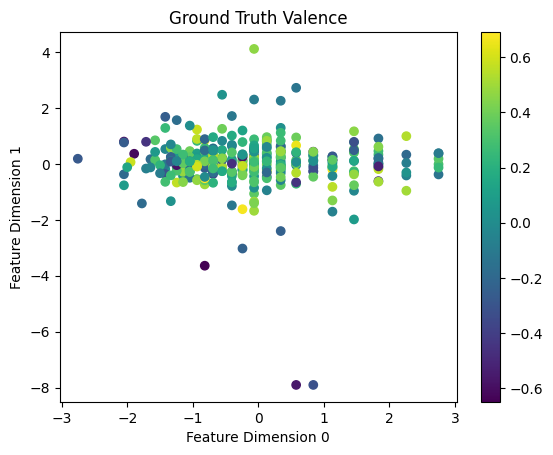

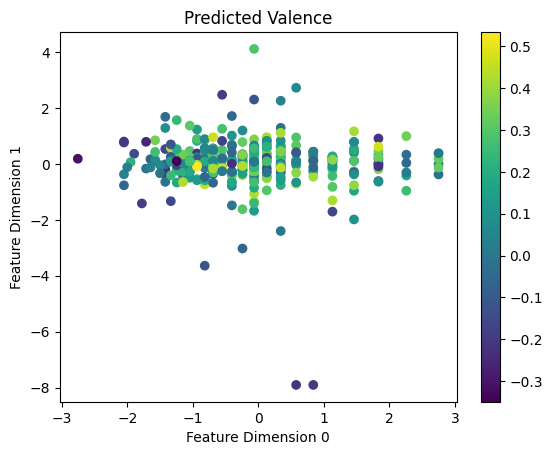

In [429]:
#Visualise ground truth vs predicted labels

#Ground Truth

plt.figure()
plt.scatter(song_arousal_test_data_fs1[:,0], song_arousal_test_data_fs1[:,1],c = arousal_test_label_fs1)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(arousal_test_label_fs1)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Ground Truth Valence")
plt.show()

#Predicted 

plt.figure()
plt.scatter(song_arousal_test_data_fs1[:,0], song_arousal_test_data_fs1[:,1],c = predicted_arousal_label_fs1)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(predicted_arousal_label_fs1)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Predicted Valence")
plt.show()

## Feature Set 2

In [436]:
#Reshape data
print(len(all_songs_feature_set_2))

reshaped_all_songs_feature_set_2 = np.delete(all_songs_feature_set_2, slice(1744, 1825), 0)

print(len(reshaped_all_songs_feature_set_2))

1744
1744


FS2 - Valence Model

In [437]:
#Split data
song_valence_train_data_fs2, song_valence_test_data_fs2, valence_train_label_fs2, valence_test_label_fs2 = tts(reshaped_all_songs_feature_set_2, reshaped_valence_for_songs, test_size=0.2)

#standardise data
fs2_song_scaler.fit(song_valence_train_data_fs2)

song_valence_train_data_fs2 = fs2_song_scaler.transform(song_valence_train_data_fs2)
song_valence_test_data_2_fs2 = fs2_song_scaler.transform(song_valence_test_data_fs2)


In [438]:
# Support Vector Regression
valence_model_fs2 = sklearn.svm.SVR()

#Valence model
valence_model_fs2.fit(song_valence_train_data_fs2, valence_train_label_fs2)

#predict labels
predicted_valence_label_fs2 = valence_model_fs2.predict(song_valence_test_data_fs2)
valence_score_fs2 = valence_model_fs2.score(song_valence_test_data_fs2, valence_test_label_fs2)

valence_mse_fs2 =mean_squared_error(valence_test_label_2, predicted_valence_label_2)

print(valence_score_fs2)
print(valence_mse_fs2)


-0.1742263978085805
0.11950149440032973


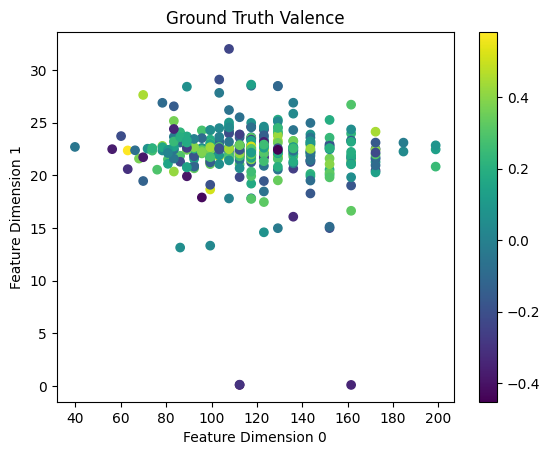

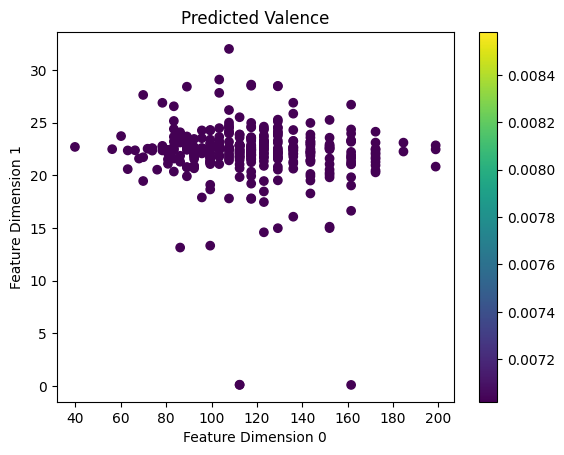

In [439]:
#Visualise ground truth vs predicted labels

#Ground Truth

plt.figure()
plt.scatter(song_valence_test_data_fs2[:,0], song_valence_test_data_fs2[:,1],c = valence_test_label_fs2)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(valence_test_label_fs2)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Ground Truth Valence")
plt.show()

#Predicted

plt.figure()
plt.scatter(song_valence_test_data_fs2[:,0], song_valence_test_data_fs2[:,1],c = predicted_valence_label_fs2)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(predicted_valence_label_fs2)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Predicted Valence")
plt.show()


FS2 - Arousal Model

In [440]:
song_arousal_train_data_fs2, song_arousal_test_data_fs2, arousal_train_label_fs2, arousal_test_label_fs2 = tts(reshaped_all_songs_feature_set_2, reshaped_arousal_for_songs, test_size=0.2)

#standardise data
fs2_song_scaler.fit(song_arousal_train_data_fs2)

song_arousal_train_data_fs2 = fs2_song_scaler.transform(song_arousal_train_data_fs2)
song_arousal_test_data_fs2 = fs2_song_scaler.transform(song_arousal_test_data_fs2)


In [441]:
# Support Vector Regression
arousal_model_fs2 = sklearn.svm.SVR()

#Valence model
arousal_model_fs2.fit(song_arousal_train_data_fs2, arousal_train_label_fs2)

#predict labels
predicted_arousal_label_fs2 = arousal_model_fs2.predict(song_arousal_test_data_fs2)
arousal_score_fs2 = arousal_model_fs2.score(song_arousal_test_data_fs2, arousal_test_label_fs2)

arousal_mse_fs2 = mean_squared_error(arousal_test_label_fs2, predicted_arousal_label_fs2)

print(arousal_score_fs2)
print(arousal_mse_fs2)


0.5860044743447876
0.032206905835748374


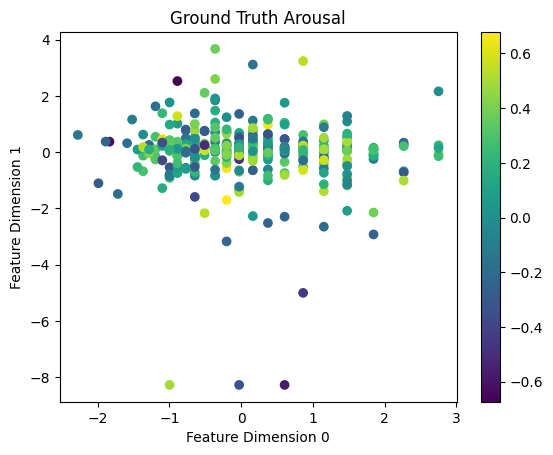

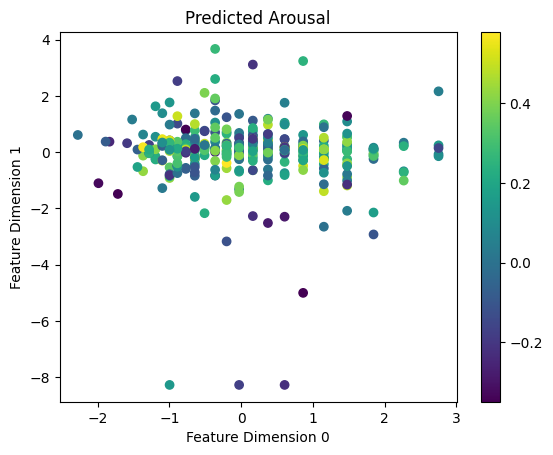

In [442]:
#Visualise ground truth vs predicted labels

#Ground Truth

plt.figure()
plt.scatter(song_arousal_test_data_fs2[:,0], song_arousal_test_data_fs2[:,1],c = arousal_test_label_fs2)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(arousal_test_label_fs2)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Ground Truth Arousal")
plt.show()

#Predicted 

plt.figure()
plt.scatter(song_arousal_test_data_fs2[:,0], song_arousal_test_data_fs2[:,1],c = predicted_arousal_label_fs2)

scalarmappaple = cm.ScalarMappable()
scalarmappaple.set_array(predicted_arousal_label_fs2)
plt.colorbar(scalarmappaple)

plt.xlabel("Feature Dimension 0")
plt.ylabel("Feature Dimension 1")
plt.title("Predicted Arousal")
plt.show()


# 5 - Results

20 runs of each model for valence and arousal

Feature Set 1

In [443]:
#Valence

fs1_valence_score_average = []

for i in range(20):
    song_valence_train_data_fs1, song_valence_test_data_fs1, valence_train_label_fs1, valence_test_label_fs1 = tts(reshaped_all_songs_feature_set_1, reshaped_valence_for_songs, test_size=0.2)

    #standardise data
    fs1_song_scaler.fit(song_valence_train_data_fs1)

    song_valence_train_data_fs1 = fs1_song_scaler.transform(song_valence_train_data_fs1)
    song_valence_test_data_fs1 = fs1_song_scaler.transform(song_valence_test_data_fs1)
    
    # Support Vector Regression
    valence_model_fs1 = sklearn.svm.SVR()

    #Valence model
    valence_model_fs1.fit(song_valence_train_data_fs1, valence_train_label_fs1)

    #predict labels
    predicted_valence_label_fs1 = valence_model_fs1.predict(song_valence_test_data_fs1)
    valence_score_fs1 = valence_model_fs1.score(song_valence_test_data_fs1, valence_test_label_fs1)

    fs1_valence_score_average.append(valence_score_fs1)

fs1_valence_score_average = np.array(fs1_valence_score_average)


In [444]:
#Arousal

fs1_arousal_score_average = []

for i in range(20):
    song_arousal_train_data_fs1, song_arousal_test_data_fs1, arousal_train_label_fs1, arousal_test_label_fs1 = tts(reshaped_all_songs_feature_set_1, reshaped_arousal_for_songs, test_size=0.2)

    #standardise data
    fs1_song_scaler.fit(song_arousal_train_data_fs1)

    song_arousal_train_data_fs1 = fs1_song_scaler.transform(song_arousal_train_data_fs1)
    song_arousal_test_data_fs1 = fs1_song_scaler.transform(song_arousal_test_data_fs1)
    
    # Support Vector Regression
    arousal_model_fs1 = sklearn.svm.SVR()

    #Valence model
    arousal_model_fs1.fit(song_arousal_train_data_fs1, arousal_train_label_fs1)

    #predict labels
    predicted_arousal_label_fs1 = arousal_model_fs1.predict(song_arousal_test_data_fs1)
    arousal_score_fs1 = arousal_model_fs1.score(song_arousal_test_data_fs1, arousal_test_label_fs1)
  
    fs1_arousal_score_average.append(arousal_score_fs1)

fs1_arousal_score_average = np.array(fs1_arousal_score_average)


Feature Set 2

In [445]:
#Valence

fs2_valence_score_average = []

for i in range(20):

    #Split data
    song_valence_train_data_fs2, song_valence_test_data_fs2, valence_train_label_fs2, valence_test_label_fs2 = tts(reshaped_all_songs_feature_set_2, reshaped_valence_for_songs, test_size=0.2)

    #standardise data
    fs2_song_scaler.fit(song_valence_train_data_fs2)

    song_valence_train_data_fs2 = fs2_song_scaler.transform(song_valence_train_data_fs2)
    song_valence_test_data_2_fs2 = fs2_song_scaler.transform(song_valence_test_data_fs2)
    
    # Support Vector Regression
    valence_model_fs2 = sklearn.svm.SVR()

    #Valence model
    valence_model_fs2.fit(song_valence_train_data_fs2, valence_train_label_fs2)

    #predict labels
    predicted_valence_label_2_fs2 = valence_model_fs2.predict(song_valence_test_data_fs2)
    valence_score_fs2 = valence_model_fs2.score(song_valence_test_data_fs2, valence_test_label_fs2)
    
    fs2_valence_score_average.append(valence_score_fs2)

fs2_valence_score_average = np.array(fs2_valence_score_average)


In [446]:
#Arousal

fs2_arousal_score_average = []

for i in range(20):

    song_arousal_train_data_fs2, song_arousal_test_data_fs2, arousal_train_label_fs2, arousal_test_label_fs2 = tts(reshaped_all_songs_feature_set_2, reshaped_arousal_for_songs, test_size=0.2)

    #standardise data
    fs2_song_scaler.fit(song_arousal_train_data_fs2)

    song_arousal_train_data_fs2 = fs2_song_scaler.transform(song_arousal_train_data_fs2)
    song_arousal_test_data_fs2 = fs2_song_scaler.transform(song_arousal_test_data_fs2)
    
    # Support Vector Regression
    arousal_model_fs2 = sklearn.svm.SVR()

    #Valence model
    arousal_model_fs2.fit(song_arousal_train_data_fs2, arousal_train_label_fs2)

    #predict labels
    predicted_arousal_label_fs2 = arousal_model_fs2.predict(song_arousal_test_data_fs2)
    arousal_score_fs2 = arousal_model_fs2.score(song_arousal_test_data_fs2, arousal_test_label_fs2)

    fs2_arousal_score_average.append(arousal_score_fs2)

fs2_arousal_score_average = np.array(fs2_arousal_score_average)


Outputs/Prints

In [447]:
print("Feature Set 1 average Valence Score:")
print(np.mean(fs1_valence_score_average))

print("Feature Set 1 average Arousal Score:")
print(np.mean(fs1_arousal_score_average))

Feature Set 1 average Valence Score:
0.08753193206097329
Feature Set 1 average Arousal Score:
0.32141156345444183


In [448]:
print("Feature Set 2 average Valence Score:")
print(np.mean(fs2_valence_score_average))

print("Feature Set 2 average Arousal Score:")
print(np.mean(fs2_arousal_score_average))

Feature Set 2 average Valence Score:
-0.1593129527832493
Feature Set 2 average Arousal Score:
0.598873069574801


# 6 - Recommender Questionnaire 

## Q1

In [450]:
#fs1

#Song 0

#Preprocess
y0, sr0 = librosa.load(songs[0])

song_0_fs1 = feature_set_1(y0, sr0)

song_0_fs1 = np.array(song_0_fs1, dtype = object)

reshaped_song_0_fs1 = song_0_fs1.reshape(1,-1)

print(reshaped_song_0_fs1)

song_0_fs1_final = fs1_song_scaler.transform(reshaped_song_0_fs1)

print(song_0_fs1_final)

#Predict using fs1 model

song_0_valence = valence_model_fs1.predict(song_0_fs1_final)

song_0_arousal = arousal_model_fs1.predict(song_0_fs1_final)

#Output

print(song_0_valence)
print(song_0_arousal)

display(Audio(songs[0]))


[[143.5546875 21.42301039956212 0.20214821 0.22225522 0.3076818
  0.47216123 0.4953441 0.34332883 0.3403563 0.54070723 0.662667
  0.46928883 0.33278483]]
[[ 8.50789959e-01 -2.65997858e-01 -1.10546864e+00 -1.14453891e+00
  -3.37853854e-01  6.58448276e-01  1.11703432e+00 -1.40564796e-05
  -2.64756393e-01  1.36330432e+00  1.90704005e+00  9.12736112e-01
  -2.26707167e-01]]
[-0.11461701]
[-0.06044223]


In [472]:
#fs1

#Song 1

#Preprocess
y1, sr1 = librosa.load(songs[1])

song_1_fs1 = feature_set_1(y1, sr1)

song_1_fs1 = np.array(song_1_fs1, dtype = object)

reshaped_song_1_fs1 = song_1_fs1.reshape(1,-1)

print(reshaped_song_1_fs1)

song_1_fs1_final = fs1_song_scaler.transform(reshaped_song_1_fs1)

print(song_1_fs1_final)

#Predict using fs1 model

song_1_valence = valence_model_fs1.predict(song_1_fs1_final)

song_1_arousal = arousal_model_fs1.predict(song_1_fs1_final)

#Output

print(song_1_valence)
print(song_1_arousal)

display(Audio(songs[1]))

[[95.703125 22.545752561071712 0.3644507 0.3967552 0.4671726 0.57773256
  0.490007 0.40214774 0.45064208 0.4598258 0.4351577 0.39253128
  0.44949517]]
[[-0.80024513  0.13353642  0.14502695  0.08962839  0.85671114  1.39308227
   1.07707488  0.45918141  0.55550247  0.74778765  0.30643116  0.32715311
   0.62534633]]
[0.23760173]
[0.45836557]


Using fs1, song 1 and song 0 are considered different

## Q2

In [455]:
#fs1

#Song 2

#Preprocess
y2, sr2 = librosa.load(songs[2])

song_2_fs1 = feature_set_1(y2, sr2)

song_2_fs1 = np.array(song_2_fs1, dtype = object)

reshaped_song_2_fs1 = song_2_fs1.reshape(1,-1)

print(reshaped_song_2_fs1)

song_2_fs1_final = fs1_song_scaler.transform(reshaped_song_2_fs1)

print(song_2_fs1_final)

#Predict using fs1 model

song_2_valence = valence_model_fs1.predict(song_2_fs1_final)

song_2_arousal = arousal_model_fs1.predict(song_2_fs1_final)

#Output

print(song_2_valence)
print(song_2_arousal)

display(Audio(songs[2]))

[[172.265625 24.20439828791477 0.20927534 0.23753154 0.25171816 0.4852342
  0.25399226 0.19047056 0.31784907 0.4426723 0.75560856 0.43129763
  0.34377426]]
[[ 1.84141101  0.72377507 -1.05055615 -1.03649566 -0.7570141   0.74941849
  -0.68999644 -1.19336888 -0.43215554  0.61724758  2.56091718  0.62290145
  -0.14647794]]
[0.24679727]
[0.27386985]


In [467]:
#fs1

#Song 3

#Preprocess
y3, sr3 = librosa.load(songs[4])

song_3_fs1 = feature_set_1(y3, sr3)

song_3_fs1 = np.array(song_3_fs1, dtype = object)

reshaped_song_3_fs1 = song_3_fs1.reshape(1,-1)

print(reshaped_song_3_fs1)

song_3_fs1_final = fs1_song_scaler.transform(reshaped_song_3_fs1)

print(song_2_fs1_final)

#Predict using fs1 model

song_3_valence = valence_model_fs1.predict(song_3_fs1_final)

song_3_arousal = arousal_model_fs1.predict(song_3_fs1_final)

#Output

print(song_3_valence)
print(song_3_arousal)

display(Audio(songs[4]))

[[117.45383522727273 23.03419501133787 0.27821037 0.3407752 0.38035017
  0.42744306 0.44595304 0.37757224 0.3649847 0.28194812 0.2714604
  0.33419228 0.3904418]]
[[ 1.84141101  0.72377507 -1.05055615 -1.03649566 -0.7570141   0.74941849
  -0.68999644 -1.19336888 -0.43215554  0.61724758  2.56091718  0.62290145
  -0.14647794]]
[0.16691867]
[0.21184705]


## Q3

In [468]:
#fs1

#Song 2

#Preprocess
y2, sr2 = librosa.load(songs[10])

song_2_fs1 = feature_set_1(y2, sr2)

song_2_fs1 = np.array(song_2_fs1, dtype = object)

reshaped_song_2_fs1 = song_2_fs1.reshape(1,-1)

print(reshaped_song_2_fs1)

song_2_fs1_final = fs1_song_scaler.transform(reshaped_song_2_fs1)

print(song_2_fs1_final)

#Predict using fs1 model

song_2_valence = valence_model_fs1.predict(song_2_fs1_final)

song_2_arousal = arousal_model_fs1.predict(song_2_fs1_final)

#Output

print(song_2_valence)
print(song_2_arousal)

display(Audio(songs[10]))


[[92.28515625 21.03409185896581 0.16629995 0.24256185 0.33863991
  0.51891166 0.3331858 0.26257873 0.24211927 0.25428236 0.28468475
  0.31404188 0.5043011]]
[[-0.91817621 -0.40439676 -1.38166954 -1.00091836 -0.10598165  0.98376816
  -0.09706478 -0.63042502 -0.99540165 -0.81642114 -0.75219956 -0.27164211
   1.02546139]]
[0.05713089]
[0.07654729]


In [469]:
#fs1

#Song 2

#Preprocess
y2, sr2 = librosa.load(songs[11])

song_2_fs1 = feature_set_1(y2, sr2)

song_2_fs1 = np.array(song_2_fs1, dtype = object)

reshaped_song_2_fs1 = song_2_fs1.reshape(1,-1)

print(reshaped_song_2_fs1)

song_2_fs1_final = fs1_song_scaler.transform(reshaped_song_2_fs1)

print(song_2_fs1_final)

#Predict using fs1 model

song_2_valence = valence_model_fs1.predict(song_2_fs1_final)

song_2_arousal = arousal_model_fs1.predict(song_2_fs1_final)

#Output

print(song_2_valence)
print(song_2_arousal)

display(Audio(songs[11]))


[[123.046875 20.908958109559613 0.3417526 0.43353954 0.517038 0.44228384
  0.47965416 0.24586603 0.28920138 0.4749785 0.409774 0.5792506 0.3996328]]
[[ 0.14320349 -0.44892633 -0.02985565  0.34978914  1.23019636  0.45054193
   0.99956183 -0.76089997 -0.6452249   0.86310135  0.12784793  1.75163379
   0.26132207]]
[0.16577987]
[0.40344483]


## Q1 ver 2

In [459]:
#fs2

#Song 0

#Preprocess
y3, sr3 = librosa.load(songs[0])

song_0_fs2 = feature_set_2(y3, sr3)

song_0_fs2 = np.array(song_0_fs2, dtype = object)

reshaped_song_0_fs2 = song_0_fs2.reshape(1,-1)

print(reshaped_song_0_fs2)

song_0_fs2_final = fs2_song_scaler.transform(reshaped_song_0_fs2)

print(song_0_fs2_final)

#Predict using fs1 model

song_0_valence = valence_model_fs2.predict(song_0_fs2_final)

song_0_arousal = arousal_model_fs2.predict(song_0_fs2_final)

#Output

print(song_0_valence)
print(song_0_arousal)

display(Audio(songs[0]))


[[143.5546875 21.42301039956212 1800.4421765594534 2122.636116830606
  23.352248652448473 0.0077812844 3797.049219051874 0.82579494 67720
  -5.210174e-06 -1.578463e-05]]
[[ 0.84901085 -0.28352877  0.01121524  0.19800384 -0.05087816 -0.34330777
   0.05644874  0.56203033 -0.32930998 -0.00261342 -0.02388066]]
[0.17173887]
[0.22452462]


In [462]:
#fs2

#Song 0

#Preprocess
y3, sr3 = librosa.load(songs[1])

song_0_fs2 = feature_set_2(y3, sr3)

song_0_fs2 = np.array(song_0_fs2, dtype = object)

reshaped_song_0_fs2 = song_0_fs2.reshape(1,-1)

print(reshaped_song_0_fs2)

song_0_fs2_final = fs2_song_scaler.transform(reshaped_song_0_fs2)

print(song_0_fs2_final)

#Predict using fs1 model

song_0_valence = valence_model_fs2.predict(song_0_fs2_final)

song_0_arousal = arousal_model_fs2.predict(song_0_fs2_final)

#Output

print(song_0_valence)
print(song_0_arousal)

display(Audio(songs[1]))

[[95.703125 22.545752561071712 965.6778718991682 1672.7309098068451
  24.62239576771215 0.0023384483 2072.6928962628867 2.249545 24138
  -7.487902e-07 -2.0278658e-05]]
[[-0.79036171  0.11943918 -1.26308364 -0.57875696  0.55146231 -0.73087853
  -1.09644466  0.80379383 -1.53169095 -0.0017525  -0.02994304]]
[0.07204533]
[-0.12525556]


## Q2 ver 2

In [461]:
#fs1

#Song 2

#Preprocess
y4, sr4 = librosa.load(songs[2])

song_2_fs2 = feature_set_2(y4, sr4)

song_2_fs2 = np.array(song_2_fs2, dtype = object)

reshaped_song_2_fs2 = song_2_fs2.reshape(1,-1)

print(reshaped_song_2_fs2)

song_2_fs2_final = fs2_song_scaler.transform(reshaped_song_2_fs2)

print(song_2_fs2_final)

#Predict using fs1 model

song_2_valence = valence_model_fs2.predict(song_2_fs2_final)

song_2_arousal = arousal_model_fs2.predict(song_2_fs2_final)

#Output

print(song_2_valence)
print(song_2_arousal)

display(Audio(songs[2]))


[[172.265625 24.20439828791477 1675.1347598698362 2086.0445359243818
  23.901176381370345 0.007000043 3365.961536525451 3.5912657 66926
  -3.401095e-07 -4.5926367e-07]]
[[ 1.83263438e+00  7.14750456e-01 -1.80071214e-01  1.34828522e-01
   2.09439236e-01 -3.98938013e-01 -2.31773678e-01  1.03162809e+00
  -3.51215591e-01 -1.67364141e-03 -3.20697126e-03]]
[0.05690017]
[0.09153264]


In [466]:
#fs1

#Song 2

#Preprocess
y4, sr4 = librosa.load(songs[4])

song_2_fs2 = feature_set_2(y4, sr4)

song_2_fs2 = np.array(song_2_fs2, dtype = object)

reshaped_song_2_fs2 = song_2_fs2.reshape(1,-1)

print(reshaped_song_2_fs2)

song_2_fs2_final = fs2_song_scaler.transform(reshaped_song_2_fs2)

print(song_2_fs2_final)

#Predict using fs1 model

song_2_valence = valence_model_fs2.predict(song_2_fs2_final)

song_2_arousal = arousal_model_fs2.predict(song_2_fs2_final)

#Output

print(song_2_valence)
print(song_2_arousal)

display(Audio(songs[4]))

[[117.45383522727273 23.03419501133787 1265.3437182164691
  2088.3501663973448 21.791786709305196 0.003053613 3022.181175738988
  4.9577556 22800 -0.00016478612 -0.0010784101]]
[[-0.04519236  0.29474804 -0.80563254  0.13880919 -0.7908943  -0.67995344
  -0.46162299  1.26366836 -1.56860495 -0.03340692 -1.45734641]]
[0.05722774]
[0.11133246]


## Q3 ver 2

In [470]:
#fs1

#Song 2

#Preprocess
y4, sr4 = librosa.load(songs[10])

song_2_fs2 = feature_set_2(y4, sr4)

song_2_fs2 = np.array(song_2_fs2, dtype = object)

reshaped_song_2_fs2 = song_2_fs2.reshape(1,-1)

print(reshaped_song_2_fs2)

song_2_fs2_final = fs2_song_scaler.transform(reshaped_song_2_fs2)

print(song_2_fs2_final)

#Predict using fs1 model

song_2_valence = valence_model_fs2.predict(song_2_fs2_final)

song_2_arousal = arousal_model_fs2.predict(song_2_fs2_final)

#Output

print(song_2_valence)
print(song_2_arousal)

display(Audio(songs[10]))

[[92.28515625 21.03409185896581 2179.619682126562 2443.770476125091
  24.73241324909884 0.0111755775 4935.113949900985 -3.754281 86259
  -7.142265e-07 -4.421299e-06]]
[[-0.90745975 -0.4231171   0.59004385  0.75244193  0.60363578 -0.10160864
   0.8173514  -0.21570106  0.18216129 -0.00174584 -0.0085517 ]]
[0.18519549]
[0.10306244]


In [471]:
#fs1

#Song 2

#Preprocess
y4, sr4 = librosa.load(songs[11])

song_2_fs2 = feature_set_2(y4, sr4)

song_2_fs2 = np.array(song_2_fs2, dtype = object)

reshaped_song_2_fs2 = song_2_fs2.reshape(1,-1)

print(reshaped_song_2_fs2)

song_2_fs2_final = fs2_song_scaler.transform(reshaped_song_2_fs2)

print(song_2_fs2_final)

#Predict using fs1 model

song_2_valence = valence_model_fs2.predict(song_2_fs2_final)

song_2_arousal = arousal_model_fs2.predict(song_2_fs2_final)

#Output

print(song_2_valence)
print(song_2_arousal)

display(Audio(songs[11]))

[[123.046875 20.908958109559613 1639.0100972282696 2002.7298208346465
  23.43666851110428 0.00855714 3545.120006443299 4.7907944 68272
  -1.2145616e-06 -1.017737e-05]]
[[ 0.14642261 -0.46802937 -0.23521686 -0.00901423 -0.01084382 -0.28806104
  -0.11198949  1.2353171  -0.31408088 -0.00184239 -0.01631655]]
[0.11369393]
[0.13914232]
